### Import Library

In [106]:
import pandas as pd
import numpy as np
import os
from functools import reduce
import seaborn as sns
import matplotlib.pyplot as plt
import math

from linearmodels import PanelOLS
from linearmodels import PooledOLS
from linearmodels import RandomEffects
from linearmodels.panel.results import compare
from linearmodels.iv import IV2SLS

from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_white, het_breuschpagan, acorr_breusch_godfrey
from statsmodels.stats.stattools import durbin_watson

import numpy.linalg as la
from scipy import stats
from scipy.stats import boxcox
from scipy.stats import kstest
from scipy.stats import chi2


pd.set_option('display.max_rows',None, 'display.max_columns',None,'display.max_colwidth', None)

### Read Data

In [107]:
ResInv = pd.read_csv('FinalVariables.csv')
ResInv.columns

Index(['Unnamed: 0_x', 'Unnamed: 0.1_x', 'Unnamed: 0.1.1_x',
       'Unnamed: 0.1.1.1_x', 'Unnamed: 0.1.1.1.1_x', 'AllYears2020',
       'AllYears2019', 'AllYears2018', 'AllYears2017', 'AllYears2016',
       ...
       'ResInv2011', 'ResInv2012', 'ResInv2013', 'ResInv2014', 'ResInv2015',
       'ResInv2016', 'ResInv2017', 'ResInv2018', 'ResInv2019', 'ResInv2020'],
      dtype='object', length=298)

- **Calculate Residential investment per landarea**

In [108]:
# Scale for land area
for row in ResInv:
    if row.startswith('ResInv2'):
        ResInv[row[:-4]+'_PerLandArea_'+row[-4:]] = ResInv[row]/ResInv['LandArea']

- **Sum Residential In a NPA from 2010 to 2020**

In [109]:
investments= []
for var in ResInv: 
    if var.startswith('ResInv20'):
        investments.append(var)
print(investments)
ResInv['InvestmentPerHU'] = ResInv[investments].sum(axis = 1)        

['ResInv2010', 'ResInv2011', 'ResInv2012', 'ResInv2013', 'ResInv2014', 'ResInv2015', 'ResInv2016', 'ResInv2017', 'ResInv2018', 'ResInv2019', 'ResInv2020']


 - **Sum Residential Investments per landarea In a NPA from 2010 to 2020**

In [110]:
investments= []
for var in ResInv: 
    if var.startswith('ResInv_PerLandArea'):
        investments.append(var)
print(investments)
ResInv['InvestmentPerLandAreaHU'] = ResInv[investments].sum(axis = 1)        

['ResInv_PerLandArea_2010', 'ResInv_PerLandArea_2011', 'ResInv_PerLandArea_2012', 'ResInv_PerLandArea_2013', 'ResInv_PerLandArea_2014', 'ResInv_PerLandArea_2015', 'ResInv_PerLandArea_2016', 'ResInv_PerLandArea_2017', 'ResInv_PerLandArea_2018', 'ResInv_PerLandArea_2019', 'ResInv_PerLandArea_2020']


In [111]:
# Scale income by dividing by 1000

# for row in ResInv:
#     if row.startswith('MHIncome'):
#         ResInv[row] = ResInv[row]/1000

- **Calculate Vacant parcels per land area**

In [112]:
#Scale for landrea

for row in ResInv:
    if row.startswith('Vacant'):
        ResInv[row[:-4]+'_PerLandArea_'+row[-4:]] = ResInv[row]/ResInv['LandArea']

- **Calculate housing investments per housing units, use the previous years to normalize** 

In [113]:
#scale for housing units

Years = [2010,2011,2012,2013,2014,2015,2016,2017,2018,2019]

for year in Years:
    print(year,year+1)
    ResInv['ResInvPerHousingUnits'+str(year)] = ResInv['ResInv'+str(year+1)]/ResInv['HousingUnits'+str(year)]

2010 2011
2011 2012
2012 2013
2013 2014
2014 2015
2015 2016
2016 2017
2017 2018
2018 2019
2019 2020


In [114]:
Years = [2020]

for year in Years:
    print(year,year+1)
    ResInv['ResInvPerHousingUnits'+str(year)] = ResInv['ResInv'+str(year)]/ResInv['HousingUnits'+str(year)]

2020 2021


- **Calculate Residential Renovations Per Housing Unit**

In [115]:
#scale for housing units
Years = [2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020]

for year in Years:
    print(year)
    ResInv['ResRenoPerHousingUnits'+str(year)] = ResInv['ResReno'+str(year)]/ResInv['HousingUnits'+str(year)]

2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020


### Education Interpolation 
- **US Census Bureau doesn't have Education attainment for the years 2010 and 2011 so use 2012 figures**

In [116]:
ResInv['PercentAdultsWithAtLeastBachelors2010'] = ResInv['PercentAdultsWithAtLeastBachelors2012']
ResInv['PercentAdultsWithAtLeastBachelors2011'] = ResInv['PercentAdultsWithAtLeastBachelors2012']

 ### Percent Change
 - **Calcuate percentage change for the explanatory variables between 2010 and 2020**

In [117]:
ResInv['PercentMinority_Change_2010_2020'] = ((ResInv['PercentMinority2020'] - ResInv['PercentMinority2010'])/
                                              ResInv['PercentMinority2010'])


ResInv['PercentWhite_Change_2010_2020'] = ((ResInv['PercentWhite2020'] - ResInv['PercentWhite2010'])/
                                              ResInv['PercentWhite2010'])

ResInv['PercentBlack_Change_2010_2020'] = ((ResInv['PercentBlack2020'] - ResInv['PercentBlack2010'])/
                                              ResInv['PercentBlack2010'])

ResInv['PercentAdultsWithAtLeastBachelors_Change_2010_2020'] = ((ResInv['PercentAdultsWithAtLeastBachelors2020'] - 
                                                                 ResInv['PercentAdultsWithAtLeastBachelors2012'])/
                                              ResInv['PercentAdultsWithAtLeastBachelors2012'])

ResInv['MedianIncome_Change_2010_2020'] = ((ResInv['MHIncome2020'] - ResInv['MHIncome2010'])/ResInv['MHIncome2010'])


ResInv['Vacant_Change_2010_2020'] = ((ResInv['Vacant2020'] - ResInv['Vacant2010'])/ResInv['Vacant2010'])


ResInv['PercentOwnerOccupied_Change_2010_2020'] = ((ResInv['PercentOwnerOccupied2010'] - ResInv['PercentOwnerOccupied2020'])
                                                  /ResInv['PercentOwnerOccupied2020'])


### Filter Columns for Melting 

In [118]:
Inv = [row for row in ResInv if row.startswith('ResInv2')]
PercentBlack = [row for row in ResInv if row.startswith('PercentBlack2')]
PercentWhite = [row for row in ResInv if row.startswith('PercentWhite2')]
PercentAsian = [row for row in ResInv if row.startswith('PercentAsian2')]
PercentHispanic = [row for row in ResInv if row.startswith('PercentHispanic2')]
PercentHawaiian = [row for row in ResInv if row.startswith('PercentHawaiian2')]
PercentAlaska = [row for row in ResInv if row.startswith('PercentAlaska2')]
PercentSomeOther = [row for row in ResInv if row.startswith('PercentSomeOther2')]
PercentTwoorMore = [row for row in ResInv if row.startswith('PercentTwoorMore2')]
PercentMinority = [row for row in ResInv if row.startswith('PercentMinority2')]
PercentOwnerOccupied = [row for row in ResInv if row.startswith('PercentOwnerOccupied2')]
MHIncome = [row for row in ResInv if row.startswith('MHIncome2')]
PercentAdultsWithAtLeastBachelors = [row for row in ResInv if row.startswith('PercentAdultsWithAtLeastBachelors2')]
PerLandArea = [row for row in ResInv if row.startswith('ResInv_PerLandArea')]
PerHousingUnit = [row for row in ResInv if row.startswith('ResInvPerHousingUnits')]
Vacant = [row for row in ResInv if row.startswith('Vacant2')]
VacantPerLandArea = [row for row in ResInv if row.startswith('Vacant_PerLandArea')]
SingleFam = [row for row in ResInv if row.startswith('Sing')]
MultiFam = [row for row in ResInv if row.startswith('Mul')]
Percent30Years = [row for row in ResInv if row.startswith('Percent30Years')]
ResReno = [row for row in ResInv if row.startswith('ResReno2')]
ResRenoHousing = [row for row in ResInv if row.startswith('ResRenoPerHousingUnits')]

### Melt Data for each Individual Category

In [119]:
InvRes = pd.melt(ResInv, id_vars= 'NPA', value_vars=Inv, value_name='ResInvestments').drop_duplicates(subset=['NPA','variable'])
Blacks = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentBlack, value_name='PercentBlack').drop_duplicates(subset=['NPA','variable'])
Whites = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentWhite, value_name='PercentWhite').drop_duplicates(subset=['NPA','variable'])
Asians = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentAsian, value_name='PercentAsian').drop_duplicates(subset=['NPA','variable'])
Hispanic = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentHispanic, value_name='PercentHispanic').drop_duplicates(subset=['NPA','variable'])
Hawaiian = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentHawaiian, value_name='PercentHawaiian').drop_duplicates(subset=['NPA','variable'])
Alaska = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentAlaska, value_name='PercentAlaska').drop_duplicates(subset=['NPA','variable'])
SomeOther = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentSomeOther, value_name='PercentSomeOther').drop_duplicates(subset=['NPA','variable'])
Mixed = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentTwoorMore, value_name='PercentTwoorMore').drop_duplicates(subset=['NPA','variable'])
Minority = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentMinority, value_name='PercentMinority').drop_duplicates(subset=['NPA','variable'])
Ownership = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentOwnerOccupied, value_name='PercentOwnerOccupied').drop_duplicates(subset=['NPA','variable'])
Income = pd.melt(ResInv, id_vars= 'NPA', value_vars=MHIncome, value_name='MHIncome').drop_duplicates(subset=['NPA','variable'])
Education = pd.melt(ResInv, id_vars= 'NPA', value_vars=PercentAdultsWithAtLeastBachelors, value_name='EducationAttainment').drop_duplicates(subset=['NPA','variable'])
ResPerLandArea = pd.melt(ResInv, id_vars= 'NPA', value_vars=PerLandArea, value_name='ResInvPerLandArea').drop_duplicates(subset=['NPA','variable'])
VacantPerLA = pd.melt(ResInv, id_vars= 'NPA', value_vars=VacantPerLandArea, value_name='VacantPerLandArea').drop_duplicates(subset=['NPA','variable'])
VacantShare= pd.melt(ResInv, id_vars= 'NPA', value_vars=Vacant, value_name='Vacant').drop_duplicates(subset=['NPA','variable'])
SingleFam = pd.melt(ResInv, id_vars= 'NPA', value_vars=SingleFam, value_name='SingleFam').drop_duplicates(subset=['NPA','variable'])
MultiFam = pd.melt(ResInv, id_vars= 'NPA', value_vars=MultiFam, value_name='MultiFam').drop_duplicates(subset=['NPA','variable'])
ResPerHousingUnit = pd.melt(ResInv, id_vars= 'NPA', value_vars=PerHousingUnit, value_name='ResInvPerHousingUnit').drop_duplicates(subset=['NPA','variable'])
PercentBuilding30Years = pd.melt(ResInv, id_vars= 'NPA', value_vars=Percent30Years, value_name='PercentBuildings30YrsPlus').drop_duplicates(subset=['NPA','variable'])
ResRenovations = pd.melt(ResInv, id_vars= 'NPA', value_vars=ResReno, value_name='ResRenovations').drop_duplicates(subset=['NPA','variable'])
ResRenovationsHousing = pd.melt(ResInv, id_vars= 'NPA', value_vars=ResRenoHousing, value_name='ResRenoPerHousingUnit').drop_duplicates(subset=['NPA','variable'])

In [120]:
# InvRes['ResInvestments'] = InvRes['ResInvestments']+1
# InvRes

In [121]:
# InvRes['logres'] = boxcox(InvRes['ResInvestments'],-0.5)
# InvRes

In [122]:
# kstest(InvRes['logres'], 'norm')

In [123]:
# kstest(InvRes['ResInvestments'], 'norm')

In [124]:
# sns.distplot(InvRes['logres'], hist = False, kde = True,
#                  kde_kws = {'linewidth': 3})

- **Make sure at the indivual dataframes have the same shape**

In [125]:
InvRes.shape,Blacks.shape,Whites.shape,Asians.shape,Hispanic.shape,Hawaiian.shape,Alaska.shape,SomeOther.shape,Mixed.shape,Minority.shape,Ownership.shape,Income.shape,Education.shape,MultiFam.shape,SingleFam.shape,VacantShare.shape,VacantPerLA.shape,ResPerHousingUnit.shape,PercentBuilding30Years.shape,ResRenovations.shape,ResRenovationsHousing.shape

((4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3),
 (4246, 3))

### Extract Year Variable from Columns

In [126]:
InvRes['Year'] = [int(row[-4:]) for row in InvRes['variable']]
ResPerLandArea['Year'] = [int(row[-4:]) for row in ResPerLandArea['variable']]
ResPerHousingUnit['Year'] =  [int(row[-4:]) for row in ResPerHousingUnit['variable']]

Blacks['Year'] = [int(row[-4:]) for row in Blacks['variable']]
Whites['Year'] = [int(row[-4:]) for row in Whites['variable']]
Asians['Year'] = [int(row[-4:]) for row in Asians['variable']]
Hispanic['Year'] = [int(row[-4:]) for row in Hispanic['variable']]
Hawaiian['Year'] = [int(row[-4:]) for row in Hawaiian['variable']]
SomeOther['Year'] = [int(row[-4:]) for row in SomeOther['variable']]
Mixed['Year'] = [int(row[-4:]) for row in Mixed['variable']]
Minority['Year'] = [int(row[-4:]) for row in Minority['variable']]

Ownership['Year'] = [int(row[-4:]) for row in Ownership['variable']]

Income['Year'] = [int(row[-4:]) for row in Income['variable']]

Education['Year'] = [int(row[-4:]) for row in Education['variable']]

VacantShare['Year'] = [int(row[-4:]) for row in VacantShare['variable']]
VacantPerLA['Year'] = [int(row[-4:]) for row in VacantPerLA['variable']]


SingleFam['Year'] = [int(row[-4:]) for row in SingleFam['variable']]

MultiFam['Year'] = [int(row[-4:]) for row in MultiFam['variable']]

PercentBuilding30Years['Year'] = [int(row[-4:]) for row in PercentBuilding30Years['variable']]

ResRenovations['Year'] = [int(row[-4:]) for row in ResRenovations['variable']]

ResRenovationsHousing['Year'] = [int(row[-4:]) for row in ResRenovationsHousing['variable']]



### Create a Panel

In [127]:
PanelDataFrame = [InvRes,Blacks,Whites,Asians,Hispanic,Hawaiian,SomeOther,Mixed,Minority,Ownership,PercentBuilding30Years,
                  Income,Education,ResPerLandArea,VacantShare,SingleFam,
                  MultiFam,VacantPerLA,ResPerHousingUnit,ResRenovations,ResRenovationsHousing]

len(PanelDataFrame)

21

### Join all dataframes 

In [128]:
Panel = reduce(lambda right,left: pd.merge(right, left, on = ['NPA', 'Year'], how = 'left'), PanelDataFrame)

In [129]:
Panel = Panel.drop_duplicates(subset=['NPA','Year'])

- **Delete Unwanted Variable Column**

In [130]:
columns = [row for row in Panel if row.startswith('variable')]
Panel = Panel.drop(columns, axis = 1)


- **Set Index**

In [131]:
Panel.set_index(['NPA', 'Year'], inplace=True)

In [132]:
Panel = Panel.sort_values(by=['NPA','Year'])


- **Check if Panel is Balanced** 

In [133]:
BalancePanel = Panel.groupby('NPA').size()

PanelMin = BalancePanel.min()
PanelMax = BalancePanel.max()
    
BalanceCheck = PanelMin == PanelMax

BalanceCheck

True

### Correlation 

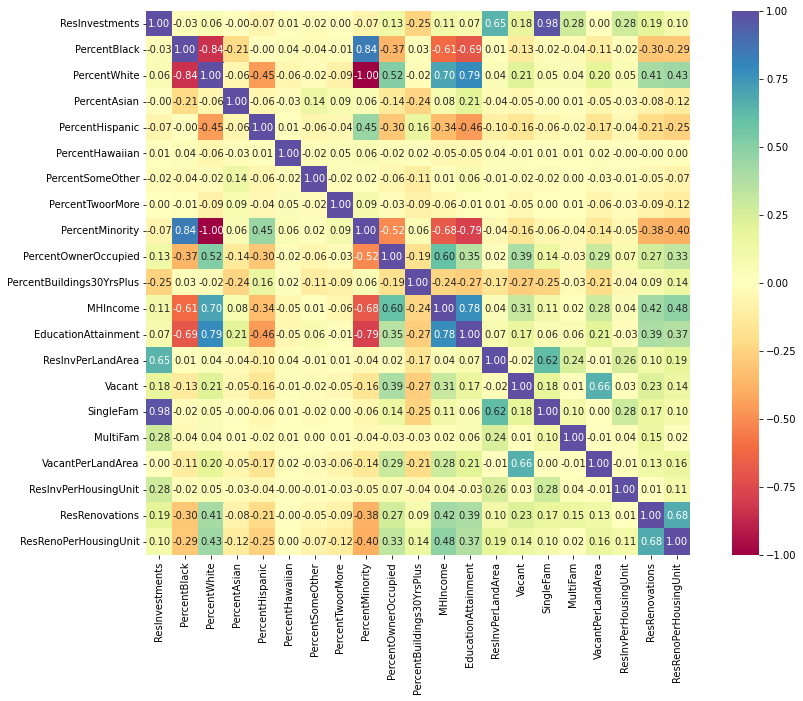

In [134]:
corrmat = Panel.corr()
f, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(corrmat, vmax=1, square=True,fmt= '.2f',annot_kws={'size': 10}, 
            annot= True, cmap="Spectral")
# plt.savefig('Correlation.jpg', bbox_inches='tight', dpi=1200)
plt.show();

In [135]:
Panel.columns

Index(['ResInvestments', 'PercentBlack', 'PercentWhite', 'PercentAsian',
       'PercentHispanic', 'PercentHawaiian', 'PercentSomeOther',
       'PercentTwoorMore', 'PercentMinority', 'PercentOwnerOccupied',
       'PercentBuildings30YrsPlus', 'MHIncome', 'EducationAttainment',
       'ResInvPerLandArea', 'Vacant', 'SingleFam', 'MultiFam',
       'VacantPerLandArea', 'ResInvPerHousingUnit', 'ResRenovations',
       'ResRenoPerHousingUnit'],
      dtype='object')

In [136]:
# ResInv.plot.scatter(x='PercentOwnerOccupied_Change_2010_2020',y = 'ResInvPerHousingUnits2020', s = 50)

### Line Graph Temporal Trend

In [137]:
# Paneltrend = ['ResInvestments', 'PercentBlack', 'PercentWhite', 'PercentAsian',
#        'PercentHispanic', 'PercentHawaiian', 'PercentSomeOther',
#        'PercentTwoorMore', 'PercentMinority', 'PercentOwnerOccupied',
#        'MHIncome', 'EducationAttainment']

In [138]:
# PanelChart =  Panel.groupby('Year')['ResInvestments', 'PercentBlack', 'PercentWhite', 'PercentAsian',
#        'PercentHispanic', 'PercentHawaiian', 'PercentSomeOther',
#        'PercentTwoorMore', 'PercentMinority', 'PercentOwnerOccupied',
#        'MHIncome', 'EducationAttainment'].mean()
# PanelChart = PanelChart.reset_index()
# PanelChart = pd.melt(PanelChart,['Year'])

In [139]:
# Paneltrend = ['ResInvestments','ResInvPerLandArea', 'PercentWhite',  'PercentMinority',
#               'PercentOwnerOccupied', 'MHIncome', 'EducationAttainment','ResInvPerHousingUnit']

In [140]:
# PanelChart =  Panel.groupby('Year')['ResInvestments', 'PercentBlack', 'PercentWhite', 'PercentAsian',
#        'PercentHispanic', 'PercentHawaiian', 'PercentSomeOther',
#        'PercentTwoorMore', 'PercentMinority', 'PercentOwnerOccupied',
#        'MHIncome', 'EducationAttainment','ResInvPerLandArea','Vacant','SingleFam', 'MultiFam'].mean()
# PanelChart = PanelChart.reset_index()
# PanelChart = pd.melt(PanelChart,['Year'])

In [141]:
# PanelChart = PanelChart[PanelChart['Year']!=2020]

In [142]:
# palette = sns.color_palette("colorblind", 4)
# g = sns.lineplot(x='Year', y= 'value',hue ='variable', data=PanelChart,  linewidth=2.5)
# plt.xticks(rotation=45)
# plt.xticks(PanelChart['Year'])
# plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, frameon=True)
# sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
# # plt.savefig('Violations.jpg', bbox_inches='tight', dpi=1200)
# plt.show(g)

## Regresssion 

In [143]:
Panel.columns

Index(['ResInvestments', 'PercentBlack', 'PercentWhite', 'PercentAsian',
       'PercentHispanic', 'PercentHawaiian', 'PercentSomeOther',
       'PercentTwoorMore', 'PercentMinority', 'PercentOwnerOccupied',
       'PercentBuildings30YrsPlus', 'MHIncome', 'EducationAttainment',
       'ResInvPerLandArea', 'Vacant', 'SingleFam', 'MultiFam',
       'VacantPerLandArea', 'ResInvPerHousingUnit', 'ResRenovations',
       'ResRenoPerHousingUnit'],
      dtype='object')

- lag independent variables

In [144]:
# Panel = Panel[Panel['ResInvestments']>0]

In [145]:
# Panel = Panel[Panel['ResInvPerLandArea']>0]

In [146]:
BalancePanel = Panel.groupby('NPA').size()

PanelMin = BalancePanel.min()
PanelMax = BalancePanel.max()
    
BalanceCheck = PanelMin == PanelMax

BalanceCheck

True

In [149]:
Panel.shape

(3662, 42)

In [148]:
### Lag variables 

Initialcol = ResInv.columns

for row in Panel:
    VarLag = 'lag_'+ row
    Panel[VarLag] = Panel.groupby(level='NPA')[row].shift(1)
    
## Replace inf with Nan
    
Panel.replace([np.inf, -np.inf], np.nan, inplace=True)
# Panel.replace([np.inf, -np.inf, np.nan], 0, inplace=True)
# Panel.to_csv('ForStepwise.csv')


## Drop na 


Panel = Panel.dropna()

- Take log of variables for transformation

In [44]:
# for row in Panel:
#     if row.startswith('lag') or row.startswith('ResInv'):
#         Panel[row] = np.log(Panel[row])
        
# # Panel.replace([np.inf, -np.inf], np.nan, inplace=True)
# Panel.replace([np.inf, -np.inf, np.nan], 0, inplace=True)
# Panel = Panel.dropna()

In [45]:
ResInv.columns

Index(['Unnamed: 0_x', 'Unnamed: 0.1_x', 'Unnamed: 0.1.1_x',
       'Unnamed: 0.1.1.1_x', 'Unnamed: 0.1.1.1.1_x', 'AllYears2020',
       'AllYears2019', 'AllYears2018', 'AllYears2017', 'AllYears2016',
       ...
       'ResRenoPerHousingUnits2020', 'PercentAdultsWithAtLeastBachelors2010',
       'PercentAdultsWithAtLeastBachelors2011',
       'PercentMinority_Change_2010_2020', 'PercentWhite_Change_2010_2020',
       'PercentBlack_Change_2010_2020',
       'PercentAdultsWithAtLeastBachelors_Change_2010_2020',
       'MedianIncome_Change_2010_2020', 'Vacant_Change_2010_2020',
       'PercentOwnerOccupied_Change_2010_2020'],
      dtype='object', length=353)

In [46]:
# df = pd.DataFrame(Panel,columns=['ResInvestments', 'PercentBlack'])
# df.plot(x='ResInvestments',subplots=True)    

# plt.tight_layout()
# plt.show()

In [47]:
# Panel[['ResInvestments', 'PercentBlack', 'PercentWhite', 'PercentAsian',
#        'PercentHispanic', 'PercentHawaiian', 'PercentSomeOther',
#        'PercentTwoorMore', 'PercentMinority', 'PercentOwnerOccupied',
#        'MHIncome', 'EducationAttainment', 'ResInvPerLandArea', 'Vacant',
#        'SingleFam', 'MultiFam', 'VacantPerLandArea', 'ResInvPerHousingUnit']].plot(subplots=True, layout=(6,6))
# plt.tight_layout()
# plt.show()


In [48]:
# sns.distplot(Panel['lag_VacantPerLandArea'], hist = False, kde = True,
#                  kde_kws = {'linewidth': 3})

In [49]:
lags = [row for row in Panel if row.startswith('lag')]
lags

['lag_ResInvestments',
 'lag_PercentBlack',
 'lag_PercentWhite',
 'lag_PercentAsian',
 'lag_PercentHispanic',
 'lag_PercentHawaiian',
 'lag_PercentSomeOther',
 'lag_PercentTwoorMore',
 'lag_PercentMinority',
 'lag_PercentOwnerOccupied',
 'lag_PercentBuildings30YrsPlus',
 'lag_MHIncome',
 'lag_EducationAttainment',
 'lag_ResInvPerLandArea',
 'lag_Vacant',
 'lag_SingleFam',
 'lag_MultiFam',
 'lag_VacantPerLandArea',
 'lag_ResInvPerHousingUnit',
 'lag_ResRenovations',
 'lag_ResRenoPerHousingUnit']

In [50]:
# corrmat = Panel[lags] .corr()
# f, ax = plt.subplots(figsize=(15, 10))
# sns.heatmap(corrmat, vmax=1, square=True,fmt= '.2f',annot_kws={'size': 10}, 
#             annot= True, cmap="Spectral")
# # plt.savefig('Correlation.jpg', bbox_inches='tight', dpi=1200)
# plt.show();

In [51]:
# Panel.ResInvestments.plot.density(color='green')
# plt.show();

In [52]:
# Panel.ResInvPerLandArea.plot.density(color='green')
# plt.show();

### For ResInvestment

In [53]:
lags = ['lag_ResInvestments',
'lag_PercentMinority',
 'lag_EducationAttainment',
 'lag_Vacant',
 'lag_MHIncome',
'lag_PercentOwnerOccupied',
'lag_PercentBuildings30YrsPlus']

Exogeneous = sm.add_constant(Panel[lags])

### Lasso Regression

In [54]:
Lasso = sm.OLS(Panel.ResInvestments, Exogeneous).fit_regularized(alpha=1.0, L1_wt=1.0)
print(Lasso.params)

const                            0.000000
lag_ResInvestments               0.834575
lag_PercentMinority              0.010325
lag_EducationAttainment          0.000000
lag_Vacant                       0.059912
lag_MHIncome                     0.000002
lag_PercentOwnerOccupied         0.009371
lag_PercentBuildings30YrsPlus   -0.006248
dtype: float64


### Ridge Regression 

In [55]:
Lasso = sm.OLS(Panel.ResInvestments, Exogeneous).fit_regularized(alpha=1.0, L1_wt=0.0)
# LassoFit = Lasso.fit_regularized(alpha = 1.0, L1_wt=1.0)
print(Lasso.params)

[ 2.62123217e-02  8.33601092e-01  1.09499792e-02  4.39838621e-03
  6.43874176e-02 -1.98752103e-06  1.04545934e-02 -7.44840658e-03]


### Pooled OLS

In [56]:
### Regression Residential investments Per Land Area on lagged Independent variables
PanelResInvestmentsPOLS = PooledOLS(Panel.ResInvestments, Exogeneous)
PanelfitPOLS = PanelResInvestmentsPOLS.fit()
fitvPOLS = PanelfitPOLS.predict().fitted_values
residPOLS = PanelfitPOLS.resids
print(PanelfitPOLS)

                          PooledOLS Estimation Summary                          
Dep. Variable:         ResInvestments   R-squared:                        0.6027
Estimator:                  PooledOLS   R-squared (Between):              0.9291
No. Observations:                3662   R-squared (Within):               0.2740
Date:                Wed, Aug 30 2023   R-squared (Overall):              0.6027
Time:                        13:48:09   Log-likelihood                -1.373e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      791.71
Entities:                         386   P-value                           0.0000
Avg Obs:                       9.4870   Distribution:                  F(7,3654)
Min Obs:                       0.0000                                           
Max Obs:                      10.0000   F-statistic (robust):             791.71
                            

### Fixed Effects

In [57]:
### Regression Residential investments on lagged Independent variables
PanelResInvestmentsFE = PanelOLS(Panel.ResInvestments, Exogeneous, entity_effects=True)
PanelFitFE = PanelResInvestmentsFE.fit(cov_type='clustered', cluster_entity=True)
residPOLSFE = PanelFitFE.resids
print(PanelFitFE)

                          PanelOLS Estimation Summary                           
Dep. Variable:         ResInvestments   R-squared:                        0.3272
Estimator:                   PanelOLS   R-squared (Between):              0.3456
No. Observations:                3662   R-squared (Within):               0.3272
Date:                Wed, Aug 30 2023   R-squared (Overall):              0.3309
Time:                        13:48:09   Log-likelihood                -1.342e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      227.28
Entities:                         386   P-value                           0.0000
Avg Obs:                       9.4870   Distribution:                  F(7,3271)
Min Obs:                       0.0000                                           
Max Obs:                      10.0000   F-statistic (robust):             16.988
                            

### Random Effects

In [58]:
PanelResInvestmentsRE = RandomEffects(Panel.ResInvestments,Exogeneous)
PanelFitRE = PanelResInvestmentsRE.fit()
residPOLSRE = PanelFitRE.resids
print(PanelFitRE)

                        RandomEffects Estimation Summary                        
Dep. Variable:         ResInvestments   R-squared:                        0.6027
Estimator:              RandomEffects   R-squared (Between):              0.9291
No. Observations:                3662   R-squared (Within):               0.2740
Date:                Wed, Aug 30 2023   R-squared (Overall):              0.6027
Time:                        13:48:09   Log-likelihood                -1.373e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      791.71
Entities:                         386   P-value                           0.0000
Avg Obs:                       9.4870   Distribution:                  F(7,3654)
Min Obs:                       0.0000                                           
Max Obs:                      10.0000   F-statistic (robust):             791.71
                            

### Residual Analysis

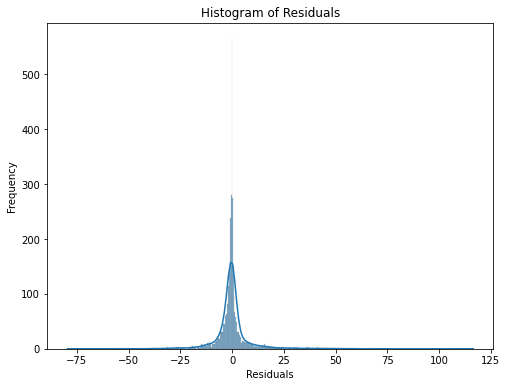

In [59]:
# Histogram of Residuals FE
plt.figure(figsize=(8, 6))
sns.histplot(residPOLSFE, kde=True)
plt.title("Histogram of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

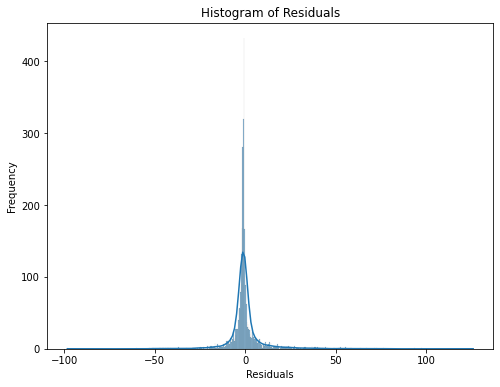

In [60]:
# Histogram of Residuals RE
plt.figure(figsize=(8, 6))
sns.histplot(residPOLSRE, kde=True)
plt.title("Histogram of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

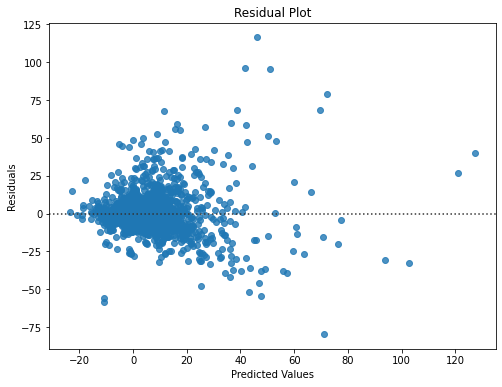

In [61]:
# Residual Plot
plt.figure(figsize=(8, 6))
sns.residplot(x=PanelFitFE.predict(), y=residPOLSFE)
plt.title("Residual Plot")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()

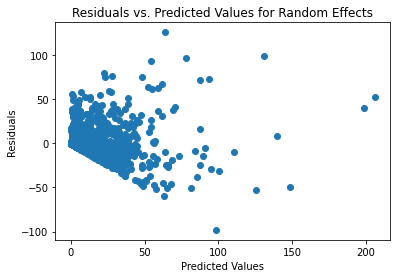

In [62]:
## Random Effects 

plt.scatter(PanelFitRE.predict(), residPOLSRE)
plt.title('Residuals vs. Predicted Values for Random Effects')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

### Model Comparison for Fixed and Random Effects

In [63]:
ModelComparison = compare({'Fixed Effects': PanelFitFE, 'Random Effects': PanelFitRE})
print(ModelComparison)

                            Model Comparison                           
                                       Fixed Effects     Random Effects
-----------------------------------------------------------------------
Dep. Variable                         ResInvestments     ResInvestments
Estimator                                   PanelOLS      RandomEffects
No. Observations                                3662               3662
Cov. Est.                                  Clustered         Unadjusted
R-squared                                     0.3272             0.6027
R-Squared (Within)                            0.3272             0.2740
R-Squared (Between)                           0.3456             0.9291
R-Squared (Overall)                           0.3309             0.6027
F-statistic                                   227.28             791.71
P-value (F-stat)                              0.0000             0.0000
===============================     ================   =========

#### Hausman Test
- The test statistic measures the difference between the estimated coefficients, a value close to zero suggests the coefficients are not significantly different from eachother
- Null Hypothesis is Random Effects is the better model, hence with a lower p value, you can reject the null hypothesis

In [64]:
fe_params = PanelFitFE.params
re_params = PanelFitRE.params
fe_cov_matrix = PanelFitFE.cov
re_cov_matrix = PanelFitRE.cov

beta_diff = fe_params - re_params

# Calculate the Hausman test statistic
hausman_test_statistic = beta_diff.T @ (fe_cov_matrix - re_cov_matrix) @ beta_diff

# Calculate the p-value
degrees_of_freedom = len(fe_params)
p_value = 1 - chi2.cdf(hausman_test_statistic, degrees_of_freedom)

# Print the results
print("Hausman Test Statistic:", hausman_test_statistic)
print("Degrees of Freedom:", degrees_of_freedom)
print("P-value:", p_value)

Hausman Test Statistic: 64.9219646329094
Degrees of Freedom: 8
P-value: 5.0006332408258913e-11


#### Baltagi, Song, and Koh Lagrange Multiplier (BSK LM) 

- Null Hypothesis is No Heteroskedasticity, when p value is low it means there is Heteroskedasticity
- Large values for the test statistic indicates stronger evidence of heteroskedasticity

In [65]:
### Fixed Effects

bsk_lm_test_statistic = PanelFitFE.resids.autocorr(1) * (len(Panel) - 1)
bsk_lm_p_value = 1 - chi2.cdf(bsk_lm_test_statistic, 1)
print(f'BSK LM Test Statistic: {bsk_lm_test_statistic}') ## Lower T Statistic Preffered
print(f'BSK LM P-Value: {bsk_lm_p_value}') 

BSK LM Test Statistic: -104.83266843879447
BSK LM P-Value: 1.0


In [66]:
### Fixed Effects

bsk_lm_test_statistic = PanelFitRE.resids.autocorr(1) * (len(Panel) - 1)
bsk_lm_p_value = 1 - chi2.cdf(bsk_lm_test_statistic, 1)
print(f'BSK LM Test Statistic: {bsk_lm_test_statistic}') ## Lower T Statistic Preffered
print(f'BSK LM P-Value: {bsk_lm_p_value}') 

BSK LM Test Statistic: -146.760758723109
BSK LM P-Value: 1.0


### For ResInvestment Per Land Area

In [67]:
lags = ['lag_ResInvPerLandArea',
'lag_PercentMinority',
 'lag_EducationAttainment',
 'lag_Vacant',
 'lag_MHIncome',
'lag_PercentOwnerOccupied',
'lag_PercentBuildings30YrsPlus']

Exogeneous = sm.add_constant(Panel[lags])

### Lasso Regression

In [68]:
Lasso = sm.OLS(Panel.ResInvPerLandArea, Exogeneous).fit_regularized(alpha=1.0, L1_wt=1.0)
print(Lasso.params)

const                            0.000000e+00
lag_ResInvPerLandArea            0.000000e+00
lag_PercentMinority              0.000000e+00
lag_EducationAttainment          0.000000e+00
lag_Vacant                       0.000000e+00
lag_MHIncome                     1.425998e-07
lag_PercentOwnerOccupied         0.000000e+00
lag_PercentBuildings30YrsPlus    0.000000e+00
dtype: float64


### Ridge Regresssion 

In [69]:
 Lasso = sm.OLS(Panel.ResInvPerLandArea, Exogeneous).fit_regularized(alpha=1.0, L1_wt=0.0)
# # LassoFit = Lasso.fit_regularized(alpha = 1.0, L1_wt=1.0)
print(Lasso.params)

[ 3.36113560e-04  5.79116379e-04  1.25523392e-04  1.98078944e-04
 -1.07500022e-04 -1.44535532e-08  5.78038648e-05 -9.10361748e-05]


### Pooled OLS

In [70]:
### Regression Residential investments on lagged Independent variables
PanelResInvestmentsPOLS = PooledOLS(Panel.ResInvPerLandArea, Exogeneous)
PanelfitPOLS = PanelResInvestmentsPOLS.fit()
fitvPOLS = PanelfitPOLS.predict().fitted_values
residPOLS = PanelfitPOLS.resids
print(PanelfitPOLS)

                          PooledOLS Estimation Summary                          
Dep. Variable:      ResInvPerLandArea   R-squared:                        0.5096
Estimator:                  PooledOLS   R-squared (Between):              0.8936
No. Observations:                3662   R-squared (Within):               0.2411
Date:                Wed, Aug 30 2023   R-squared (Overall):              0.5096
Time:                        13:48:14   Log-likelihood                    8953.9
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      542.39
Entities:                         386   P-value                           0.0000
Avg Obs:                       9.4870   Distribution:                  F(7,3654)
Min Obs:                       0.0000                                           
Max Obs:                      10.0000   F-statistic (robust):             542.39
                            

### Fixed Effects

In [71]:
### Regression Residential investments on lagged Independent variables
PanelResInvestmentsFE = PanelOLS(Panel.ResInvPerLandArea, Exogeneous, entity_effects=True)
PanelFitFE = PanelResInvestmentsFE.fit(cov_type='clustered', cluster_entity=True)
residPOLSFE = PanelFitFE.resids
print(PanelFitFE)

                          PanelOLS Estimation Summary                           
Dep. Variable:      ResInvPerLandArea   R-squared:                        0.2782
Estimator:                   PanelOLS   R-squared (Between):             -0.1694
No. Observations:                3662   R-squared (Within):               0.2782
Date:                Wed, Aug 30 2023   R-squared (Overall):              0.1011
Time:                        13:48:14   Log-likelihood                    9211.2
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      180.07
Entities:                         386   P-value                           0.0000
Avg Obs:                       9.4870   Distribution:                  F(7,3271)
Min Obs:                       0.0000                                           
Max Obs:                      10.0000   F-statistic (robust):             34.958
                            

### Random Effects

In [72]:
PanelResInvestmentsRE = RandomEffects(Panel.ResInvPerLandArea,Exogeneous)
PanelFitRE = PanelResInvestmentsRE.fit()
residPOLSRE = PanelFitRE.resids
print(PanelFitRE)

                        RandomEffects Estimation Summary                        
Dep. Variable:      ResInvPerLandArea   R-squared:                        0.5096
Estimator:              RandomEffects   R-squared (Between):              0.8936
No. Observations:                3662   R-squared (Within):               0.2411
Date:                Wed, Aug 30 2023   R-squared (Overall):              0.5096
Time:                        13:48:14   Log-likelihood                    8953.9
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      542.39
Entities:                         386   P-value                           0.0000
Avg Obs:                       9.4870   Distribution:                  F(7,3654)
Min Obs:                       0.0000                                           
Max Obs:                      10.0000   F-statistic (robust):             542.39
                            

### Model Comparison

In [73]:
ModelComparison = compare({'Fixed Effects': PanelFitFE, 'Random Effects': PanelFitRE})
print(ModelComparison )

                               Model Comparison                              
                                          Fixed Effects        Random Effects
-----------------------------------------------------------------------------
Dep. Variable                         ResInvPerLandArea     ResInvPerLandArea
Estimator                                      PanelOLS         RandomEffects
No. Observations                                   3662                  3662
Cov. Est.                                     Clustered            Unadjusted
R-squared                                        0.2782                0.5096
R-Squared (Within)                               0.2782                0.2411
R-Squared (Between)                             -0.1694                0.8936
R-Squared (Overall)                              0.1011                0.5096
F-statistic                                      180.07                542.39
P-value (F-stat)                                 0.0000         

#### Hausman Test

In [74]:
fe_params = PanelFitFE.params
re_params = PanelFitRE.params
fe_cov_matrix = PanelFitFE.cov
re_cov_matrix = PanelFitRE.cov

beta_diff = fe_params - re_params

# Calculate the Hausman test statistic
hausman_test_statistic = beta_diff.T @ (fe_cov_matrix - re_cov_matrix) @ beta_diff

# Calculate the p-value
degrees_of_freedom = len(fe_params)
p_value = 1 - chi2.cdf(hausman_test_statistic, degrees_of_freedom)

# Print the results
print("Hausman Test Statistic:", hausman_test_statistic)
print("Degrees of Freedom:", degrees_of_freedom)
print("P-value:", p_value)

Hausman Test Statistic: 0.00010947856241364662
Degrees of Freedom: 8
P-value: 1.0


#### Baltagi, Song, and Koh Lagrange Multiplier (BSK LM) 

In [75]:
### Fixed Effects

bsk_lm_test_statistic = PanelFitFE.resids.autocorr(1) * (len(Panel) - 1)
bsk_lm_p_value = 1 - chi2.cdf(bsk_lm_test_statistic, 1)
print(f'BSK LM Test Statistic: {bsk_lm_test_statistic}') ## Lower T Statistic Preffered
print(f'BSK LM P-Value: {bsk_lm_p_value}')

BSK LM Test Statistic: -1.1238433613012573
BSK LM P-Value: 1.0


In [76]:
### Fixed Effects

bsk_lm_test_statistic = PanelFitRE.resids.autocorr(1) * (len(Panel) - 1)
bsk_lm_p_value = 1 - chi2.cdf(bsk_lm_test_statistic, 1)
print(f'BSK LM Test Statistic: {bsk_lm_test_statistic}') ## Lower T Statistic Preffered
print(f'BSK LM P-Value: {bsk_lm_p_value}')

BSK LM Test Statistic: -34.44148652554441
BSK LM P-Value: 1.0


### Residual Analysis

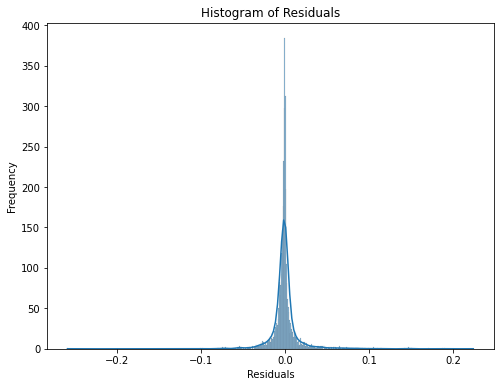

In [77]:
# Histogram of Residuals FE
plt.figure(figsize=(8, 6))
sns.histplot(residPOLSFE, kde=True)
plt.title("Histogram of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

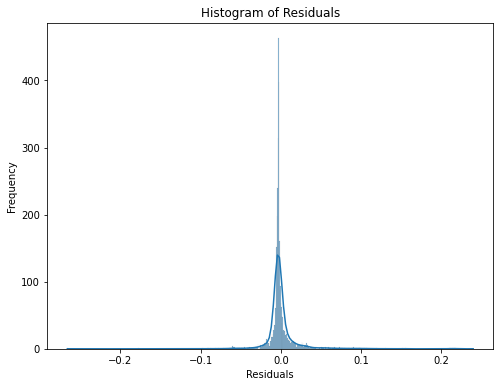

In [78]:
# Histogram of Residuals RE
plt.figure(figsize=(8, 6))
sns.histplot(residPOLSRE, kde=True)
plt.title("Histogram of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

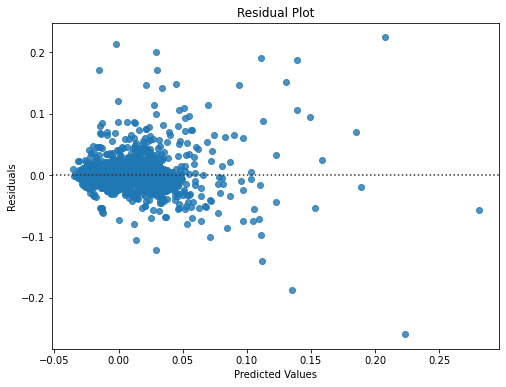

In [79]:
# Residual Plot
plt.figure(figsize=(8, 6))
sns.residplot(x=PanelFitFE.predict(), y=residPOLSFE)
plt.title("Residual Plot")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()

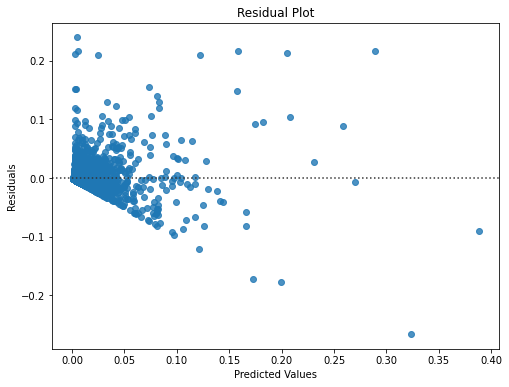

In [80]:
# Residual Plot
plt.figure(figsize=(8, 6))
sns.residplot(x=PanelFitRE.predict(), y=residPOLSRE)
plt.title("Residual Plot")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()

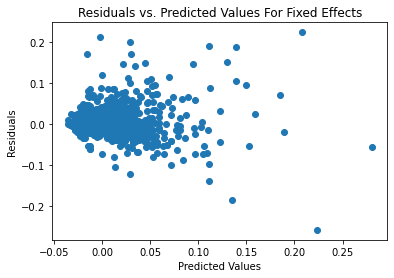

In [81]:
## Fixed Effects 
plt.scatter(PanelFitFE.predict(), residPOLSFE)
plt.title('Residuals vs. Predicted Values For Fixed Effects')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

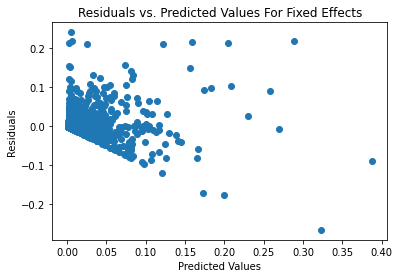

In [82]:
## For Random Effects 
plt.scatter(PanelFitRE.predict(), residPOLSRE)
plt.title('Residuals vs. Predicted Values For Fixed Effects')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

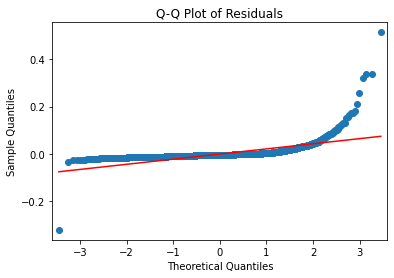

In [105]:
# Normality of residuals (Q-Q plot)
sm.qqplot(residPOLS, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()

### For Housing Investment Per Housing Unit

In [84]:
lags = [row for row in Panel if row.startswith('lag')]
lags

Exogeneous = sm.add_constant(Panel[lags])

In [85]:
lags = ['lag_ResInvPerLandArea',
'lag_PercentMinority',
 'lag_EducationAttainment',
 'lag_Vacant',
 'lag_MHIncome',
'lag_PercentOwnerOccupied',
'lag_PercentBuildings30YrsPlus']

Exogeneous = sm.add_constant(Panel[lags])

#### Lasso Regression

In [86]:
Lasso = sm.OLS(Panel.ResInvPerHousingUnit, Exogeneous).fit_regularized(alpha=1.0, L1_wt=1.0)
print(Lasso.params)

const                            0.0
lag_ResInvPerHousingUnit         0.0
lag_PercentMinority              0.0
lag_EducationAttainment          0.0
lag_Vacant                       0.0
lag_PercentOwnerOccupied         0.0
lag_PercentBuildings30YrsPlus    0.0
dtype: float64


### Pooled Regression

In [87]:
### Regression Residential investments on lagged Independent variables
PanelResInvestmentsHUPOLS = PooledOLS(Panel.ResInvPerHousingUnit, Exogeneous)
PanelfitHUOLS = PanelResInvestmentsHUPOLS.fit()
fitvPOLS = PanelfitHUOLS.predict().fitted_values
residPOLS = PanelfitHUOLS.resids
print(PanelfitHUOLS)

                           PooledOLS Estimation Summary                           
Dep. Variable:     ResInvPerHousingUnit   R-squared:                        0.2115
Estimator:                    PooledOLS   R-squared (Between):              0.3066
No. Observations:                  3662   R-squared (Within):               0.1181
Date:                  Wed, Aug 30 2023   R-squared (Overall):              0.2115
Time:                          13:48:19   Log-likelihood                    8844.7
Cov. Estimator:              Unadjusted                                           
                                          F-statistic:                      163.35
Entities:                           386   P-value                           0.0000
Avg Obs:                         9.4870   Distribution:                  F(6,3655)
Min Obs:                         0.0000                                           
Max Obs:                        10.0000   F-statistic (robust):             163.35
    

### Fixed Effects

In [88]:
### Regression Residential investments on lagged Independent variables
PanelResInvestmentsHUFE = PanelOLS(Panel.ResInvPerHousingUnit, Exogeneous, entity_effects=True)
PanelFitHUFE = PanelResInvestmentsHUFE.fit(cov_type='clustered', cluster_entity=True)
residPOLSHUFE = PanelFitHUFE.resids
print(PanelFitFE)

                          PanelOLS Estimation Summary                           
Dep. Variable:      ResInvPerLandArea   R-squared:                        0.2782
Estimator:                   PanelOLS   R-squared (Between):             -0.1694
No. Observations:                3662   R-squared (Within):               0.2782
Date:                Wed, Aug 30 2023   R-squared (Overall):              0.1011
Time:                        13:48:14   Log-likelihood                    9211.2
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      180.07
Entities:                         386   P-value                           0.0000
Avg Obs:                       9.4870   Distribution:                  F(7,3271)
Min Obs:                       0.0000                                           
Max Obs:                      10.0000   F-statistic (robust):             34.958
                            

### Random Effects

In [89]:
PanelResInvestmentsHURE = RandomEffects(Panel.ResInvPerHousingUnit,Exogeneous)
PanelFitHURE = PanelResInvestmentsHURE.fit()
residPOLSHURE = PanelFitHURE.resids
print(PanelFitHURE)

                         RandomEffects Estimation Summary                         
Dep. Variable:     ResInvPerHousingUnit   R-squared:                        0.1536
Estimator:                RandomEffects   R-squared (Between):              0.2607
No. Observations:                  3662   R-squared (Within):               0.1384
Date:                  Wed, Aug 30 2023   R-squared (Overall):              0.1958
Time:                          13:48:19   Log-likelihood                    9608.1
Cov. Estimator:              Unadjusted                                           
                                          F-statistic:                      110.58
Entities:                           386   P-value                           0.0000
Avg Obs:                         9.4870   Distribution:                  F(6,3655)
Min Obs:                         0.0000                                           
Max Obs:                        10.0000   F-statistic (robust):             110.37
    

### Hausmann Test

In [90]:
fe_params = PanelFitHUFE.params
re_params = PanelFitHURE.params
fe_cov_matrix = PanelFitHUFE.cov
re_cov_matrix = PanelFitHURE.cov

beta_diff = fe_params - re_params

# Calculate the Hausman test statistic
hausman_test_statistic = beta_diff.T @ (fe_cov_matrix - re_cov_matrix) @ beta_diff

# Calculate the p-value
degrees_of_freedom = len(fe_params)
p_value = 1 - chi2.cdf(hausman_test_statistic, degrees_of_freedom)

# Print the results
print("Hausman Test Statistic:", hausman_test_statistic)
print("Degrees of Freedom:", degrees_of_freedom)
print("P-value:", p_value)

Hausman Test Statistic: 1.407592655459914e-06
Degrees of Freedom: 7
P-value: 1.0


In [91]:
Panel

ResInvestments  PercentBlack  PercentWhite  PercentAsian  \
NPA Year                                                             
2   2011               0     25.336323     60.201794      6.109865   
    2012               0     25.336323     60.201794      6.109865   
    2013               0     30.720000     56.853333      3.733333   
    2014               2     22.907725     63.787554      3.540773   
    2015               0     24.592009     51.547552      6.246483   
    2016               5     25.417722     60.506329      2.126582   
    2017               3     27.883279     54.052802      0.509495   
    2018               1     35.191308     54.888994      0.566840   
    2019              13     33.416959     55.945810      0.602107   
    2020               9     28.789756     57.703428      0.495663   
3   2011              16     10.138977     83.480733      1.073910   
    2012              19     10.138977     83.480733      1.073910   
    2013              56      7.056570     87.772540      0.824985   
    2014              20      6.403209     86.911306      1.233101   
    2015              50      7.355922     86.055604      1.245294   
    2016              52      6.924533     83.283744      2.799567   
    2017              42      7.487771     83.757682      2.633889   
    2018              75      8.263978     81.702028      3.516587   
    2019              40      7.840836     83.475571      3.243013   
    2020               7      1.081686     88.362551      4.587840   
4   2011               1      0.000000    100.000000      0.000000   
    2012               1      0.000000    100.000000      0.000000   
    2013               2      0.000000    100.000000      0.000000   
    2014               2      0.000000    100.000000      0.000000   
    2015               8      0.000000     99.365751      0.634249   
    2016               2      0.000000     94.923858      5.076142   
    2017               2      0.000000     95.142857      4.857143   
    2018               5      0.000000     96.638655      3.361345   
    2019               3      0.000000     96.102819      3.897181   
    2020               2      0.000000     87.411348      4.166667   
5   2011               0     90.270270      3.783784      1.216216   
    2012               0     90.270270      3.783784      1.216216   
    2013               0     80.967742     10.967742      1.935484   
    2014               0     78.895184     10.906516      3.541076   
    2015               0     74.464580     15.485997      4.118616   
    2016               0     81.974249     11.731044      1.430615   
    2017               0     91.623711      6.701031      1.675258   
    2018               0     89.781022      8.759124      1.459854   
    2019               2     94.599018      5.400982      0.000000   
    2020               1     94.918699      5.081301      0.000000   
6   2011               0     83.860590     10.026810      0.000000   
    2012               0     83.860590     10.026810      0.000000   
    2013               0     84.550709     12.611666      2.837625   
    2014               0     82.531098     11.357491      4.380746   
    2015               0     78.101803     11.240721      7.688229   
    2016               1     78.487753     12.726305      4.259851   
    2017               0     76.677489     17.153680      0.865801   
    2018               1     77.174515     14.847645      1.108033   
    2019               5     74.084052     16.487069      1.077586   
    2020              12     67.674419     19.011628      0.058140   
7   2011               0      0.000000    100.000000      0.000000   
    2012               0      0.000000    100.000000      0.000000   
    2013               2      0.000000    100.000000      0.000000   
    2014               2      0.000000    100.000000      0.000000   
    2015               3      0.000000     96.705107      0.000000   
    2016            

### Variance Inflation Factor

In [92]:
PercentChange = ['PercentWhite_Change_2010_2020','MedianIncome_Change_2010_2020','PercentBlack_Change_2010_2020',
                 'Vacant_Change_2010_2020','PercentOwnerOccupied_Change_2010_2020','PercentMinority_Change_2010_2020',
               'PercentAdultsWithAtLeastBachelors_Change_2010_2020']

In [93]:
VIF = pd.DataFrame(ResInv[PercentChange])
VIF.replace([np.inf, -np.inf,np.nan], 0, inplace=True)

In [94]:
ResInv.replace([np.inf, -np.inf,np.nan], 0, inplace=True)

In [95]:
def calc_vif(X):
    vif = pd.DataFrame()
    vif['Variable'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)


In [96]:
calc_vif(VIF).sort_values(by=['VIF'],ascending=False)

,Variable,VIF
5,PercentMinority_Change_2010_2020,1.262199
2,PercentBlack_Change_2010_2020,1.243938
1,MedianIncome_Change_2010_2020,1.213678
3,Vacant_Change_2010_2020,1.151700
0,PercentWhite_Change_2010_2020,1.112399
6,PercentAdultsWithAtLeastBachelors_Change_2010_2020,1.084583
4,PercentOwnerOccupied_Change_2010_2020,1.029328


In [97]:
# PercentChange = ['PercentWhite_Change_2010_2020','MedianIncome_Change_2010_2020','PercentBlack_Change_2010_2020',
#                  'Vacant_Change_2010_2020','PercentOwnerOccupied_Change_2010_2020','PercentMinority_Change_2010_2020',
#                'PercentAdultsWithAtLeastBachelors_Change_2010_2020']

In [98]:
PercentChange = ['PercentWhite_Change_2010_2020','PercentOwnerOccupied_Change_2010_2020',
                 'PercentAdultsWithAtLeastBachelors_Change_2010_2020']

In [99]:
ResInv['InvestmentPerHU'] = np.log(ResInv['InvestmentPerHU'])

# ResInv

C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\pandas\core\series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [100]:
ResInv.replace([np.inf, -np.inf,np.nan], 0, inplace=True)

# ResInv = ResInv.dropna()

ResInv.shape

(772, 353)

In [101]:
Exogeneous = sm.add_constant(ResInv[PercentChange])

PerAgg = sm.OLS(ResInv.InvestmentPerHU, Exogeneous)
PerAggOLS = PerAgg.fit()
print(PerAggOLS.summary())

                            OLS Regression Results                            
Dep. Variable:        InvestmentPerHU   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.384
Date:                Wed, 30 Aug 2023   Prob (F-statistic):              0.246
Time:                        13:48:25   Log-Likelihood:                -1578.5
No. Observations:                 772   AIC:                             3165.
Df Residuals:                     768   BIC:                             3184.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                                         coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------

C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  


<AxesSubplot:xlabel='InvestmentPerHU', ylabel='Density'>

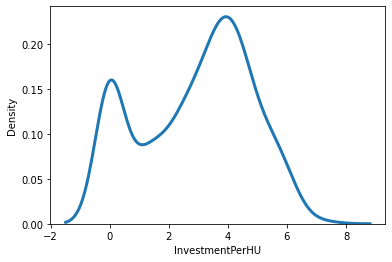

In [102]:
sns.distplot(ResInv['InvestmentPerHU'], hist = False, kde = True,
                 kde_kws = {'linewidth': 3})

eval_env: 1


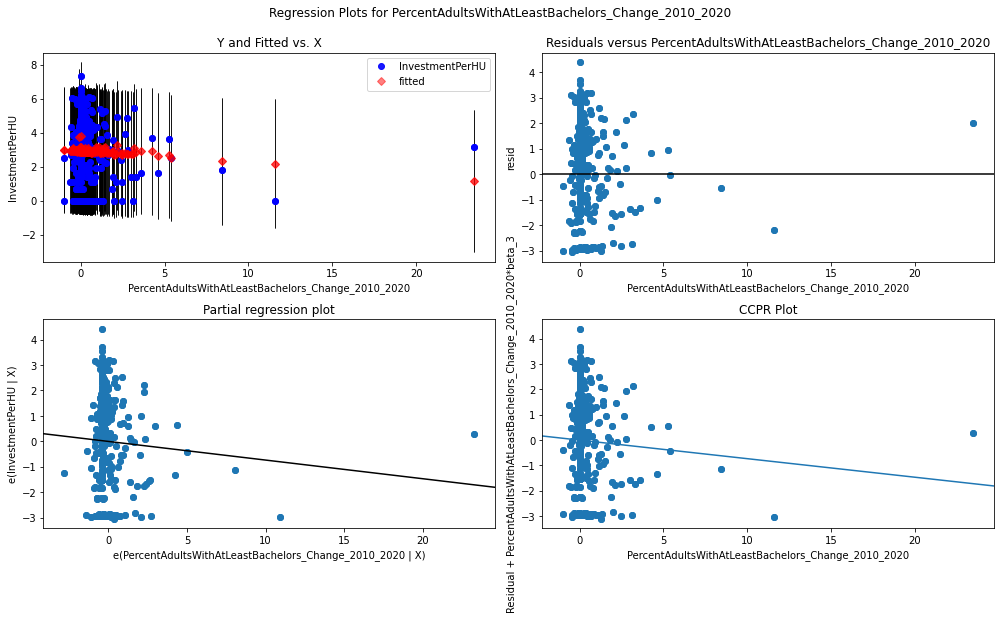

In [103]:
fig = plt.figure(figsize=(14, 8))

fig = sm.graphics.plot_regress_exog(PerAggOLS, 'PercentAdultsWithAtLeastBachelors_Change_2010_2020', fig = fig)

In [104]:
white_test = het_white(PerAggOLS.resid,  PerAggOLS.model.exog)

labels = ['Test Statistic', 'Test Statistic p-value', 'F-Statistic', 'F-Test p-value']

pd.DataFrame(dict(zip(labels, white_test)), index=[1])

,Test Statistic,Test Statistic p-value,F-Statistic,F-Test p-value
1,20.434191,0.015414,2.301987,0.014884
